In [45]:
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference,screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, exposure, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from scipy.ndimage import affine_transform, zoom
from scipy import datasets, misc
from skimage.util import img_as_float

3000 2000 RGB JPEG <class 'PIL.JpegImagePlugin.JpegImageFile'>


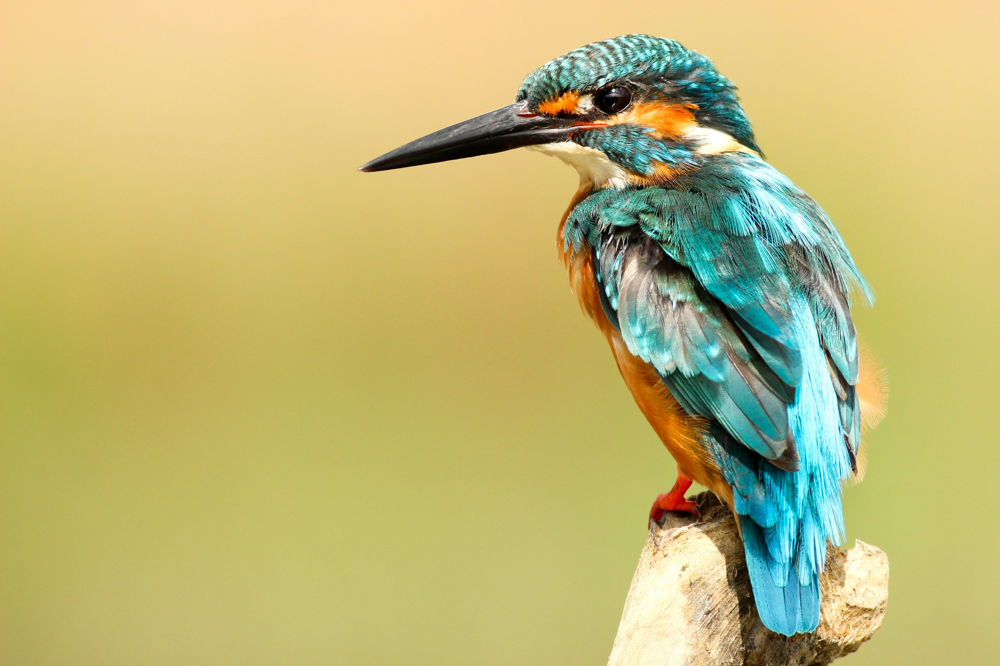

In [11]:
im = Image.open("./image_test/brids1.jpeg") # Reading image
print(im.width, im.height, im.mode, im.format, type(im))
im

# Converting RGB to grayscale

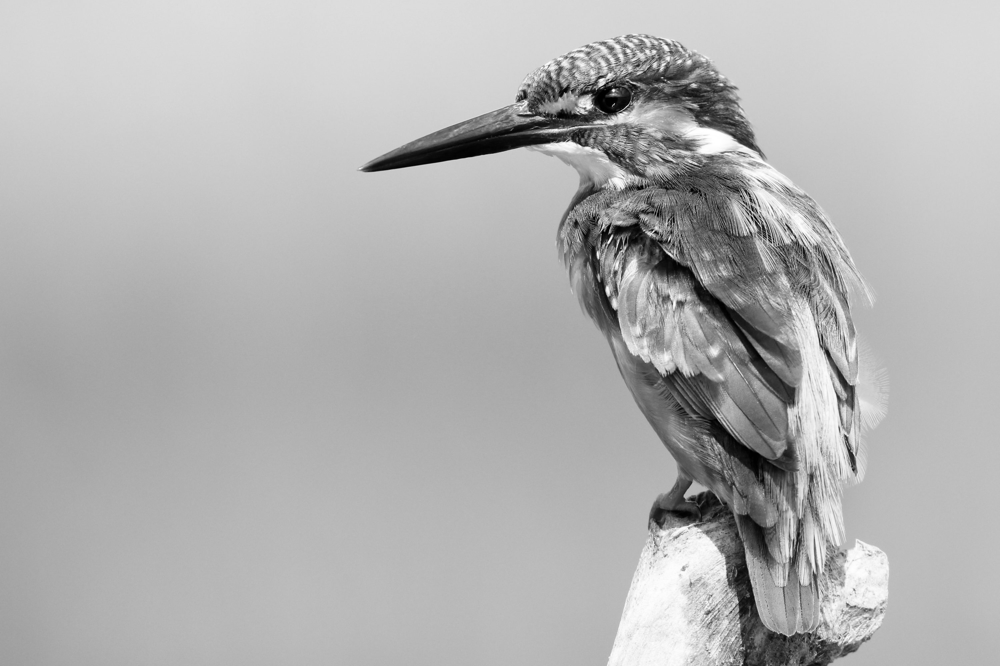

In [ ]:
img_to_grayscale = im.convert('L')
img_to_grayscale
## To save we can use "img.save("path new image")"

### Reading saving and displaying an image using matplotlib

(2000, 3000, 3) uint8


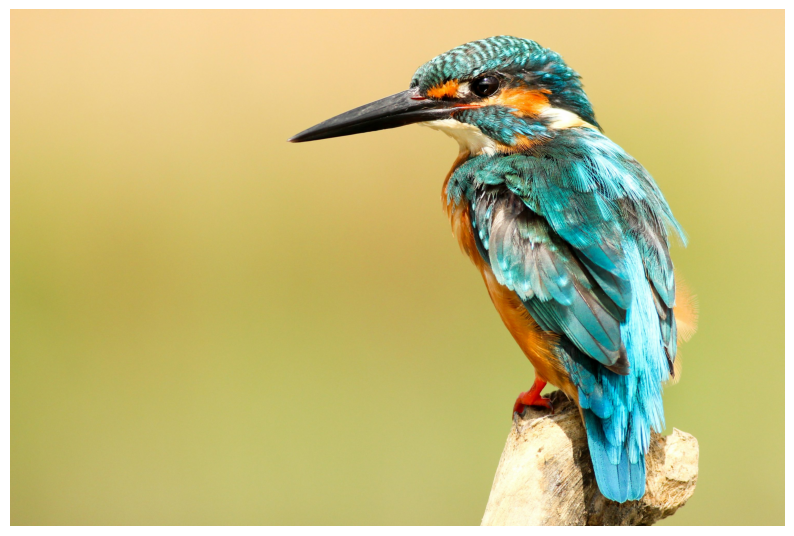

In [15]:
im1 = mpimg.imread('./image_test/brids1.jpeg')
print(im1.shape, im1.dtype) ## Se lee la imagen en formato ndarray
plt.figure(figsize=(10,10))
plt.imshow(im1)
plt.axis('off')
plt.show()

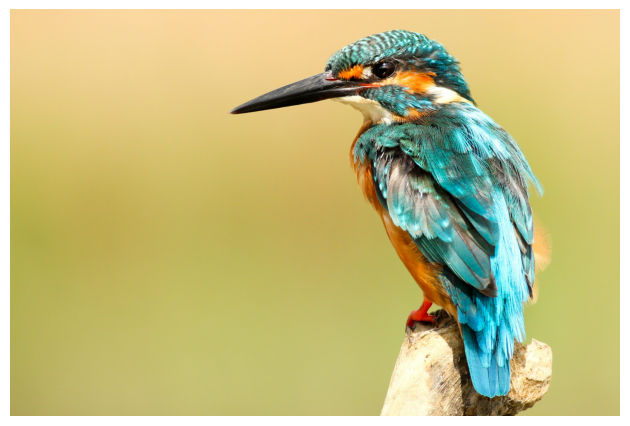

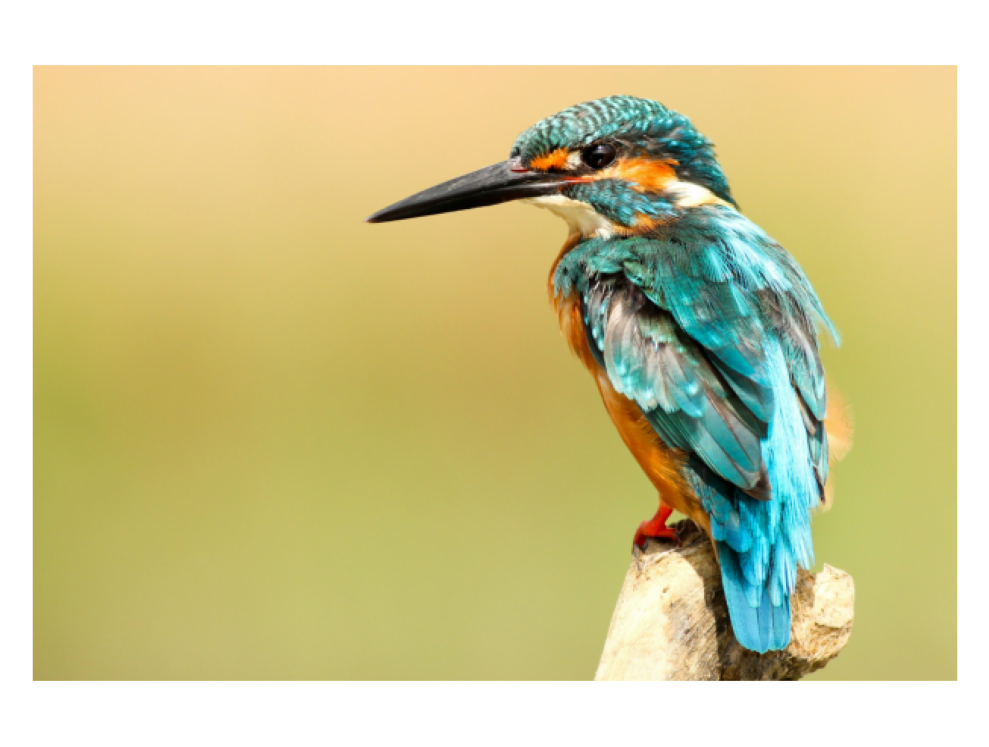

In [21]:
im2 = np.copy(im1)
im2[im2 < 0.5] = 0
plt.imshow(im2)
plt.axis('off')
plt.tight_layout()
plt.savefig('./image_test/bird_darker.png')
im3 = mpimg.imread('./image_test/bird_darker.png')
plt.figure(figsize=(10,10))
plt.imshow(im3)
plt.axis('off')
plt.tight_layout()
plt.show()

### Interpolating while displaying with matplotlib imshow()

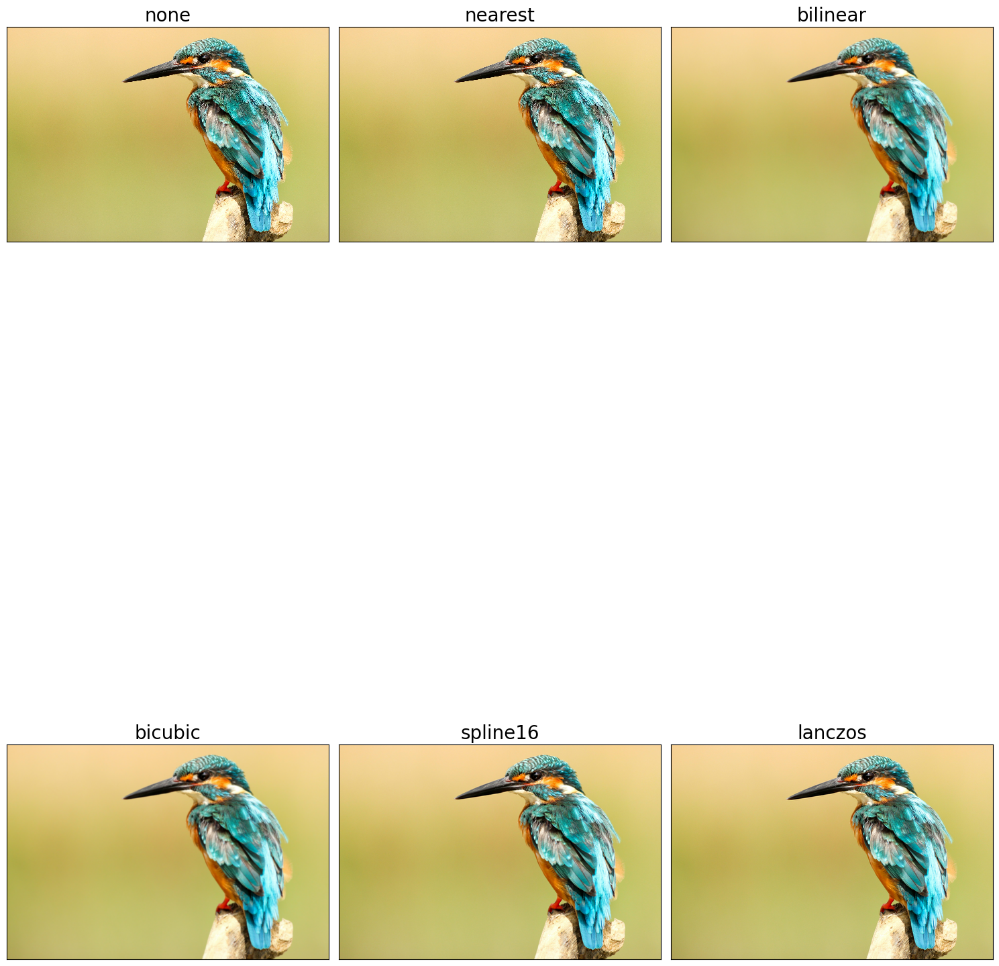

In [26]:
im4 = mpimg.imread("./image_test/brids1.jpeg")
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15,30), subplot_kw={'xticks':[], 'yticks':[]})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im,interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

### Reading, saving and displaying an image using sk-image

(2000, 3000, 3) uint8 <class 'numpy.ndarray'>


/tmp/ipykernel_62134/691398004.py:8: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), imshow(imskim), show()
/tmp/ipykernel_62134/691398004.py:8: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  plt.axis('off'), imshow(imskim), show()


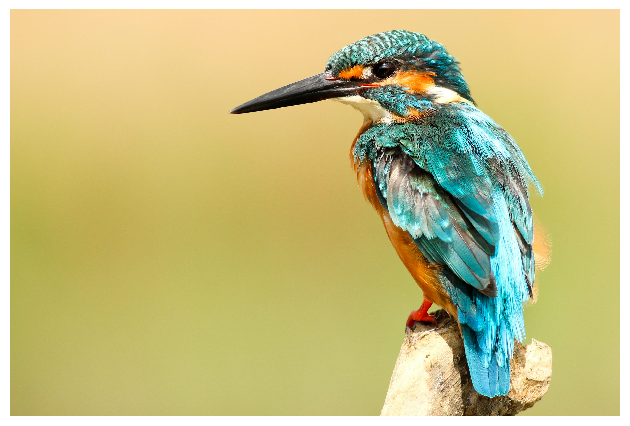

((np.float64(0.0), np.float64(1.0), np.float64(0.0), np.float64(1.0)),
 None)

In [33]:
imskim = imread('./image_test/brids1.jpeg')
print(imskim.shape, imskim.dtype, type(imskim))
hsv = color.rgb2hsv(imskim)
hsv[:,:,1] = 0.8 # Changing saturation
imhsv = color.hsv2rgb(hsv)
imsave('./image_test/bird_hsv.png', imskim)
imskim = imread('./image_test/bird_hsv.png')
plt.axis('off'), imshow(imskim), show()

/tmp/ipykernel_62134/565703806.py:2: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(im_astronaut), show()
/tmp/ipykernel_62134/565703806.py:2: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(im_astronaut), show()


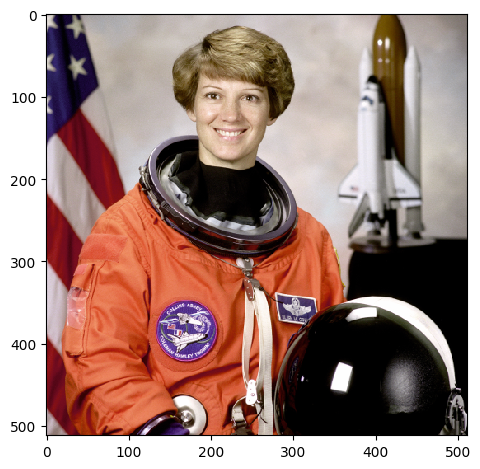

(<matplotlib.image.AxesImage at 0x7defc7766cf0>, None)

In [38]:
im_astronaut = data.astronaut() # data from library from skimage import data
imshow(im_astronaut), show()

### Using imageio

/tmp/ipykernel_62134/621743417.py:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread('./image_test/brids1.jpeg')


<class 'numpy.ndarray'> (2000, 3000, 3) uint8


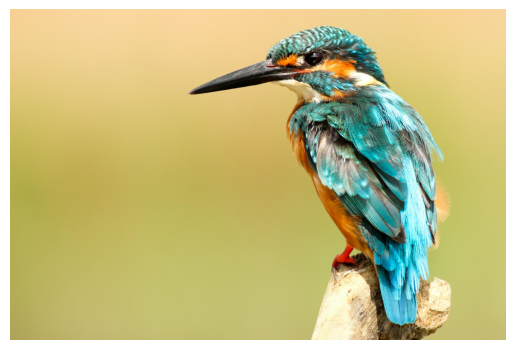

(<matplotlib.image.AxesImage at 0x7defce65abd0>,
 (np.float64(-0.5), np.float64(2999.5), np.float64(1999.5), np.float64(-0.5)),
 None)

In [51]:
import imageio

image = imageio.imread('./image_test/brids1.jpeg')
print(type(image), image.shape, image.dtype)
plt.imshow(image), plt.axis('off'), plt.show()

### Converting from one file to another

Using PIL, we can read an image in one file format and save it to another; for example, from PNG to JPG, as shown in the following:

In [54]:
im = Image.open('./image_test/brids1.jpeg')
print(im.mode)
## Saving in another format
im.save('./image_test/bird2.png')

RGB


But if the PNG file is in the RGBA mode, we need to convert it into the RGB mode before we save it as JPG, as otherwise it will give an error. The next code block shows how to first convert and then save:

In [ ]:
# image2 = Image.open('./image_test/bird2.png')
# print(image2.mode)
# image2.save('./image_test/test.png')

RGB


### Converting from one image mode into another

(146, 149, 3)


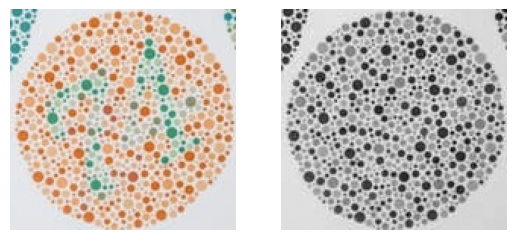

In [ ]:
imn = imread('image_test/Hands-On-Image-Processing-with-Python-Second-Edition/Chapter01/images/Ishihara.png')
## El error es que tengo canal extra RGBA canal alpha o transparencia
## Para solucionarlo quitamos el canal alpha

imn_rgb = imn[:,:,:3] ## Esa indexación con numpy significa que voy a tomar 
img_g = color.rgb2gray(imn_rgb)

plt.subplot(121), plt.imshow(imn_rgb, cmap='gray'), plt.axis('off')## 121 1 fila, 2 columnas, 1 izquierda
plt.subplot(122), plt.imshow(img_g, cmap='gray'), plt.axis('off')
print(imn_rgb.shape)

### Converting from one color space into another

(<Axes: title={'center': 'v'}>,
 Text(0.5, 1.0, 'v'),
 (np.float64(-0.5), np.float64(452.5), np.float64(339.5), np.float64(-0.5)))

<Figure size 640x480 with 0 Axes>

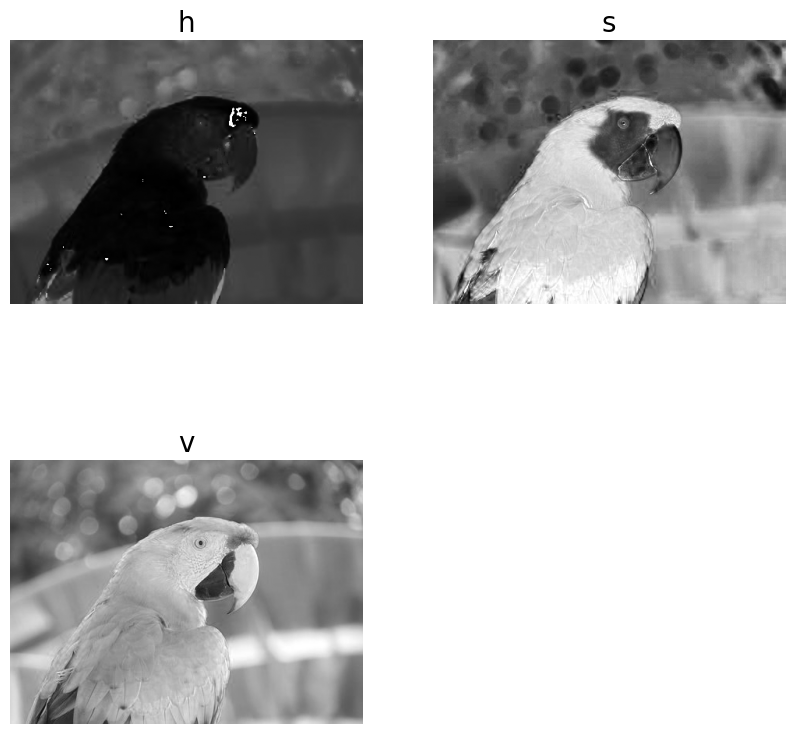

In [87]:
im = imread('./image_test/Hands-On-Image-Processing-with-Python-Second-Edition/Chapter01/images/parrot.png')
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,10))
plt.subplot(221), plt.imshow(im_hsv[:,:,0]), plt.title('h', size=20), plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[:,:,1]), plt.title('s', size=20), plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[:,:,2]), plt.title('v', size=20), plt.axis('off')

(<Axes: title={'center': 'v'}>,
 Text(0.5, 1.0, 'v'),
 (np.float64(-0.5), np.float64(452.5), np.float64(339.5), np.float64(-0.5)))

<Figure size 640x480 with 0 Axes>

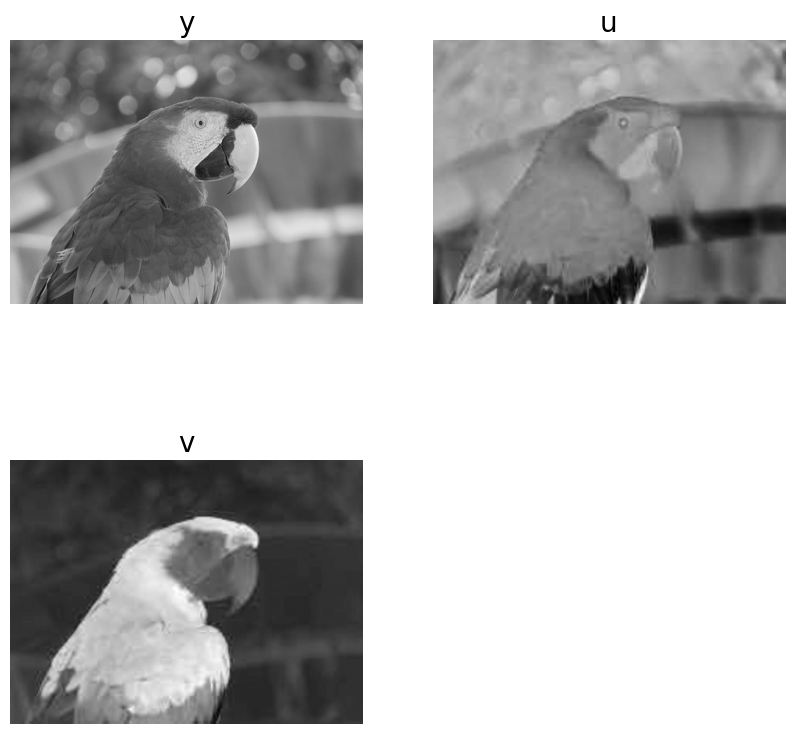

In [89]:
im = imread('./image_test/Hands-On-Image-Processing-with-Python-Second-Edition/Chapter01/images/parrot.png')
im_yuv = color.rgb2yuv(im)
plt.gray()
plt.figure(figsize=(10,10))
plt.subplot(221), plt.imshow(im_yuv[:,:,0]), plt.title('y', size=20), plt.axis('off')
plt.subplot(222), plt.imshow(im_yuv[:,:,1]), plt.title('u', size=20), plt.axis('off')
plt.subplot(223), plt.imshow(im_yuv[:,:,2]), plt.title('v', size=20), plt.axis('off')